# Example: Deploying a Pitch Estimation Model in Audacity

This notebook shows how to deploy the [FCNF0++](https://github.com/interactiveaudiolab/penn) pitch estimation model of [Morrison et al. (2023)](https://arxiv.org/abs/2301.12258) in Audacity. Minor modifications have been made to the original code to support [JIT-scripting](https://pytorch.org/docs/stable/jit.html), which is required for `audacitorch` models.

In [1]:
import os
import json
import math
from pathlib import Path
from typing import Union
from IPython.display import Audio, display

import torch
import torchaudio

# Disable gradient computation
torch.set_grad_enabled(False)

SAMPLE_RATE = 48_000
PREDICT_S = 0.5
HOP_LENGTH = int(SAMPLE_RATE * PREDICT_S)  # Output predictions every .5 seconds

### Load Audio Example

In [2]:
# Load audio (sine sweep)
x, sr = torchaudio.load("../assets/audio/sample_2.wav")

# Resample to model rate
x = torchaudio.transforms.Resample(sr, SAMPLE_RATE, dtype=x.dtype)(x)

### Initialize Model & Load Weights

In [14]:
from pitch import Pitch
model = Pitch(
    sample_rate=SAMPLE_RATE,
    hop_length=HOP_LENGTH
)
state_dict = torch.load("../assets/models/pitch.pt")  # Pretrained weights
model.load_state_dict(state_dict, strict=False)

<All keys matched successfully>

### Predict Pitch

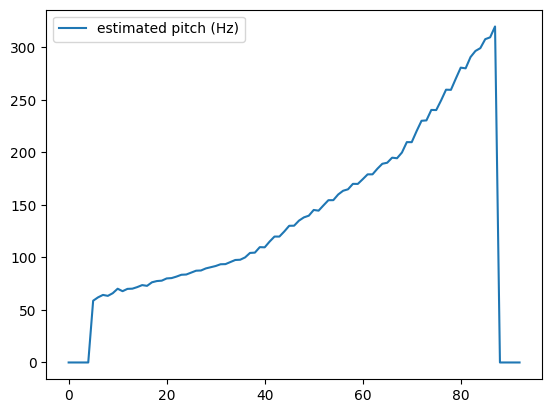

In [15]:
import matplotlib.pyplot as plt

with torch.no_grad():

    pitch, periodicity = model(x)
    plt.plot(pitch.flatten().numpy(), label="estimated pitch (Hz)")

    plt.legend()
    plt.show()
    
Audio(x.flatten().numpy(), rate=SAMPLE_RATE)

### Model Metadata

To deploy our scripted model to Audacity via `audacitorch`, we need to provided the [required metadata](https://github.com/audacitorch/audacitorch#model-metadata).

In [41]:
# Obtain set of all possible pitch-class labels
from util import f0_to_pitch, encode_output, LOW, HIGH, FMIN, FMAX

LABELS = [LOW, HIGH]
for f0 in range(int(FMIN), int(FMAX)):
    f0 = f0 * 1.0
    if f0_to_pitch(f0) not in LABELS:
        LABELS.append(f0_to_pitch(f0))

# Create a dictionary with model metadata
metadata = {
    'displayname': 'FCNF0++ pitch estimator',
    'sample_rate': SAMPLE_RATE, 
    'domain_tags': ['speech'],
    'author': 'Max Morrison, Caedon Hsieh, Nathan Pruyne, and Bryan Pardo',
    'short_description': 'I predict the pitch of your audio, in the range [B0, B6]',  # Max 60 characters
    'long_description': 
              'This is an Audacity wrapper for the model, '
              'FCNF0++ from the repository '
              'https://github.com/interactiveaudiolab/penn '
              'by Max Morrison, Caedon Hsieh, Nathan Pruyne, and Bryan Pardo.',  # Max 280 characters
    'tags': ['pitch', 'pitch-tracker'],
    'effect_type': 'waveform-to-labels',  # Must be one of 'waveform-to-waveform' or 'waveform-to-labels'
    'multichannel': False, # FCNF0++ operates on mono audio,
    'labels': LABELS,  # For waveform-to-labels models, we need to provide the possible output labels as a list
}

### Model Wrapper & Serialization

Next, we wrap our model in a subclass of `audacitorch.core.WaveformToLabelsBase` and serialize. This will create a folder (`../outputs/pitch/`) holding our model and metadata.

In [36]:
from audacitorch.core import WaveformToLabelsBase
from audacitorch.utils import save_model, validate_metadata

class PitchWrapper(WaveformToLabelsBase):
    
    def __init__(
        self, 
        model: torch.nn.Module, 
    ):
        super().__init__(model)
        
        assert isinstance(self.model, Pitch)
        
        # Save for time-stamp calculations
        self.sample_rate = self.model.sample_rate  
        self.hop_length = self.model.hop_length

    def get_timestamps(self, num_preds: int):
        """
        A utility method for obtaining timestamps for model predictions.
        
        Parameters
        ----------
        num_preds (int):
            number of model predictions for which to assign time-stamps
            
        Returns
        -------
        timestamps (torch.Tensor):
            tensor containing start and end time-stamps for model predictions; 
            shape (num_preds, 2)
        """
        if num_preds == 0:
            timestamps = torch.empty(1, 0)  # Account for missing predictions
            equal_size_timestamp = 0.
        else:
            equal_size_timestamp = self.hop_length / self.sample_rate
            timestamps = torch.zeros(num_preds, 2)
            
        for i in range(num_preds):
            if i == 0:
                timestamps[0][1] = equal_size_timestamp
            else:
                timestamps[i][0] = timestamps[i-1][1]
                timestamps[i][1] = timestamps[i][0] + equal_size_timestamp
        
        return timestamps
    
    def check_empty_output(self, preds: torch.Tensor, timestamps: torch.Tensor):
        """Check timestamps to account for missing predictions"""
        if preds.shape[0] == 0:
            return torch.tensor([0]), torch.tensor([[0., 0.01]])
        else:
            return preds, timestamps
    
    def do_forward_pass(self, x: torch.Tensor):
        
        if x.ndim == 1:
            x = x.unsqueeze(0) # (n_channels, n_frames)
        
        # Obtain pitch estimates as floating-point Hz values
        f0, _ = self.model(x)  # (n_channels, n_frames)
                
        # Convert pitch estimates to one-hot vectors
        preds = encode_output(f0)  # (n_channels, n_frames, n_labels) 
                
        # Remove channel dimension
        preds = preds[0]  # (n_frames, n_labels)
                
        # Convert frame indices to timestamps
        num_preds = preds.shape[0]
        timestamps = self.get_timestamps(num_preds)
                
        # Return predictions and timestamps as tensors
        preds = torch.argmax(preds, dim=-1, keepdim=False) if preds.numel() else preds  # (n_frames,)        
        preds, timestamps = self.check_empty_output(preds, timestamps)
        return (preds, timestamps)

In [37]:
wrapped = PitchWrapper(model)

# Because our model and utility code are JIT-compatible, we can script with a single call
scripted = torch.jit.script(wrapped)

In [ ]:
# Example of predicted pitch-class indices and timesteps
output = scripted(x)

print("Pitch class indices:", output[0])
print("Time stamps (start time, end time):", output[1])

In [42]:
# Check that our metadata is formatted correctly
valid, msg = validate_metadata(metadata)
assert valid

# We can now save our model and metadata to disk
save_model(scripted, metadata, Path('../outputs/pitch'))

### Add ReadMe for Model Registry

To allow Audacity to locate our model, we need to add a `README.md` file with a special tag.

In [43]:
content = '''---
tags:
- audacity
---'''

with open(Path('../outputs/pitch') / 'README.md', 'w') as file:
    file.write(content)

### Upload to HuggingFace

Finally, we will create a HuggingFace repository with the contents of our output directory. __Fill in your HuggingFace username and access token below.__ For instructions on how to generate a HuggingFace access token, see [here](https://huggingface.co/docs/hub/security-tokens).

In [44]:
from huggingface_hub import login, create_repo, HfApi, HfFolder

In [45]:
your_name = <YOUR_USERNAME_HERE>
your_token = <YOUR_ACCESS_TOKEN_HERE>

In [ ]:
login(your_token)

In [ ]:
api = HfApi()

# Create a new repository
repo_url = api.create_repo(
    repo_id=f"{your_name}-pitch-example", 
    token=your_token, 
    exist_ok=True,
    private=False,  # The repo must be public for Audacity to locate your model
    repo_type="model"
)

# Upload our output directory
api.upload_folder(
    folder_path=Path('../outputs/pitch'),
    repo_id=f"{your_name}/{your_name}-pitch-example",
    repo_type="model",
)

Your model should now be searchable from within Audacity's `Deep Learning Analyzer` menu!